<a href="https://colab.research.google.com/github/tansla/HWs_git/blob/master/H_W_1_Task1_transfer_learning_tutorial_Tatiana_and_Hadas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning for Computer Vision Tutorial
**Extended from [code](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html) by [Sasank Chilamkurthy](https://chsasank.github.io).**  
License: BSD.

In this tutorial, you will learn how to train a convolutional neural network for
image classification using transfer learning. You can read more about the transfer
learning at the [CS231N notes](https://cs231n.github.io/transfer-learning/).

Quoting these notes:

    In practice, very few people train an entire Convolutional Network
    from scratch (with random initialization), because it is relatively
    rare to have a dataset of sufficient size. Instead, it is common to
    pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
    contains 1.2 million images with 1000 categories), and then use the
    ConvNet either as an initialization or a fixed feature extractor for
    the task of interest.

These two major transfer learning scenarios look as follows:

-  **Finetuning the convnet**: Instead of random initializaion, we
   initialize the network with a pretrained network, like the one that is
   trained on imagenet 1000 dataset. Rest of the training looks as
   usual.
-  **ConvNet as fixed feature extractor**: Here, we will freeze the weights
   for all of the network except that of the final fully connected
   layer. This last fully connected layer is replaced with a new one
   with random weights and only this layer is trained.




**Submitted by:**


*   Tatiana Barladyan
*   Hadas Neuman



### Running notes
If you are running this in Google Colab, be sure to change the runtime to GPU by clicking `Runtime > Change runtime type` and selecting "GPU" from the dropdown menu.

### Import relevant packages

In [ ]:
%matplotlib inline

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt
import time
import os
import copy
plt.ion()   # interactive mode

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms

## Load Data

We will use `torchvision` and `torch.utils.data` packages for loading the
data.

The problem we're going to solve today is to train a model to classify
present and future **Israeli politicians**.  
We have about ~100 training images for each of our 9 politicians, automatically scraped from the first page of the Google Images Search without manual review.  
Usually, this is a very small dataset to generalize upon, if trained from scratch (or is it? We'll soon test this ourselves!). Since we are using transfer learning, we should be able to generalize reasonably well.

In [ ]:
# Create a folder for our data
# The ! prefix runs this as a shell command
!mkdir data
!mkdir data/israeli_politicians

In [ ]:
# Download our dataset and extract it
import requests
from zipfile import ZipFile

url = 'https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true'
r = requests.get(url, allow_redirects=True)
open('./data/israeli_politicians.zip', 'wb').write(r.content)

with ZipFile('./data/israeli_politicians.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall(path='./data/israeli_politicians/')

In [ ]:
# On Linux machines, the following simpler code can be used instead
# !wget https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true
# !unzip israeli_politicians.zip -d data/israeli_politicians/

### Dataset Review
At this stage, we suggest that you review your given data and get to know it better.  
Try to look for things that might interfere with its ability to learn and generalize.

### Datasets definition
PyTorch uses DataLoaders to define datasets. We'll create 2 data loaders, `train` and `val` (for validation).  
Our dataset was already split into different folders for these - as you can see under the "Files" menu on the left of the Colab.

In [ ]:
# Define transformations that resize the images to 256x256, and normalize them. 
# The means and standard deviations of each channel are the values used for normalization in ImageNet
means = [0.485, 0.456, 0.406] # H: RBG
stds = [0.229, 0.224, 0.225]

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),  # H: ImageNet gets these dimensions 
        transforms.ToTensor(), # H: multi-dim array
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

In [ ]:
# H: The name of the folder is going to be the label and apply the data transform
data_dir = r'./data/israeli_politicians/'

# Create a dictionary of train and val datasets from images in folders
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}

A data loader wraps an iterable around the Dataset to enable easy access to the samples. It combines a dataset and a sampler.

In [ ]:
# H: Data loader - gives us a batch of 16 images (large number - quick, smaller - more accurate)
# H: Shuffle - to try new directions by chance
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }

In [ ]:
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

class_names = image_datasets['train'].classes
print('class_names:', class_names)

dataset_sizes:  {'train': 929, 'val': 234}
class_names: ['ayelet_shaked', 'benjamin_netanyahu', 'benny_gantz', 'danny_danon', 'gideon_saar', 'kostya_kilimnik', 'naftali_bennett', 'ofir_akunis', 'yair_lapid']


In [ ]:
# Check for the availability of a GPU, and use CPU otherwise
# If you are using Google Colab, be sure to change your runtime environment to GPU first.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

### Datasets and Dataloaders
Let's examine the dataloaders and datasets and learn more about their attributes and functions.  

In [ ]:
train_dataloader = dataloaders['train']

In Colab or Jupyter notebook, if we type  `train_dataloader.` and wait, we'd see a drop-down with the object attributes and functions.  

`train_dataloader.dataset.samples` contains the filenames + true labels (0 to 8 for our 9 classes).  
`train_dataloader.dataset.classes` contains the class names in order.  
`train_dataloader.dataset.class_to_idx` contains a map from a class name to the integer that represents it.

In [ ]:
train_dataloader.dataset.class_to_idx

{'ayelet_shaked': 0,
 'benjamin_netanyahu': 1,
 'benny_gantz': 2,
 'danny_danon': 3,
 'gideon_saar': 4,
 'kostya_kilimnik': 5,
 'naftali_bennett': 6,
 'ofir_akunis': 7,
 'yair_lapid': 8}

### Visualize a few images

Let's visualize a few training images so as to understand the data
augmentations.



In [ ]:
# A helper function to show an image from a tensor. We need to restore it to the original dynamic range before normalization
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(means)
    std = np.array(stds)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(5,3), dpi=300)
    plt.imshow(inp)
    if title is not None:
       plt.title(title, fontsize=5)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
# Get a batch of training data - the data loader is a generator
inputs, classes = next(iter(dataloaders['train']))

`inputs` is a tensor of shape `[16, 3, 256, 256]` - there are 16 images in the batch, each with 3 color channels (RGB), a width of 256 pixels, and a height of 256 pixels:

In [ ]:
inputs.shape

torch.Size([16, 3, 256, 256])

In [ ]:
# H: 256X256X3 for R B G
inputs

tensor([[[[ 0.0741,  0.0741,  0.0912,  ...,  0.3309,  0.3138,  0.3138],
          [ 0.0912,  0.0912,  0.1083,  ...,  0.3309,  0.3309,  0.3309],
          [ 0.1254,  0.1254,  0.1254,  ...,  0.3652,  0.3481,  0.3481],
          ...,
          [-1.9124, -1.9124, -1.8953,  ..., -1.2103, -1.1589, -1.1247],
          [-1.9295, -1.9124, -1.9124,  ..., -1.2103, -1.1760, -1.1418],
          [-1.9295, -1.9295, -1.9124,  ..., -1.2103, -1.1760, -1.1418]],

         [[ 0.5378,  0.5378,  0.5553,  ...,  0.8004,  0.7829,  0.7829],
          [ 0.5553,  0.5553,  0.5728,  ...,  0.8004,  0.8004,  0.8004],
          [ 0.5903,  0.5903,  0.5903,  ...,  0.8354,  0.8179,  0.8179],
          ...,
          [-1.8782, -1.8782, -1.8606,  ..., -1.2129, -1.1604, -1.1253],
          [-1.8957, -1.8782, -1.8782,  ..., -1.2129, -1.1779, -1.1429],
          [-1.8957, -1.8957, -1.8782,  ..., -1.2129, -1.1779, -1.1604]],

         [[ 1.4548,  1.4548,  1.4722,  ...,  1.7163,  1.6988,  1.6988],
          [ 1.4722,  1.4722,  

`classes` is a tensor of size 16, containing numbers matching the true class of each image, from our 9 classes.

In [ ]:
classes

tensor([2, 1, 7, 4, 1, 0, 7, 2, 6, 4, 4, 6, 5, 2, 1, 6])

To map it to the class names, we can run:

In [ ]:
[class_names[c] for c in classes]

['benny_gantz',
 'benjamin_netanyahu',
 'ofir_akunis',
 'gideon_saar',
 'benjamin_netanyahu',
 'ayelet_shaked',
 'ofir_akunis',
 'benny_gantz',
 'naftali_bennett',
 'gideon_saar',
 'gideon_saar',
 'naftali_bennett',
 'kostya_kilimnik',
 'benny_gantz',
 'benjamin_netanyahu',
 'naftali_bennett']

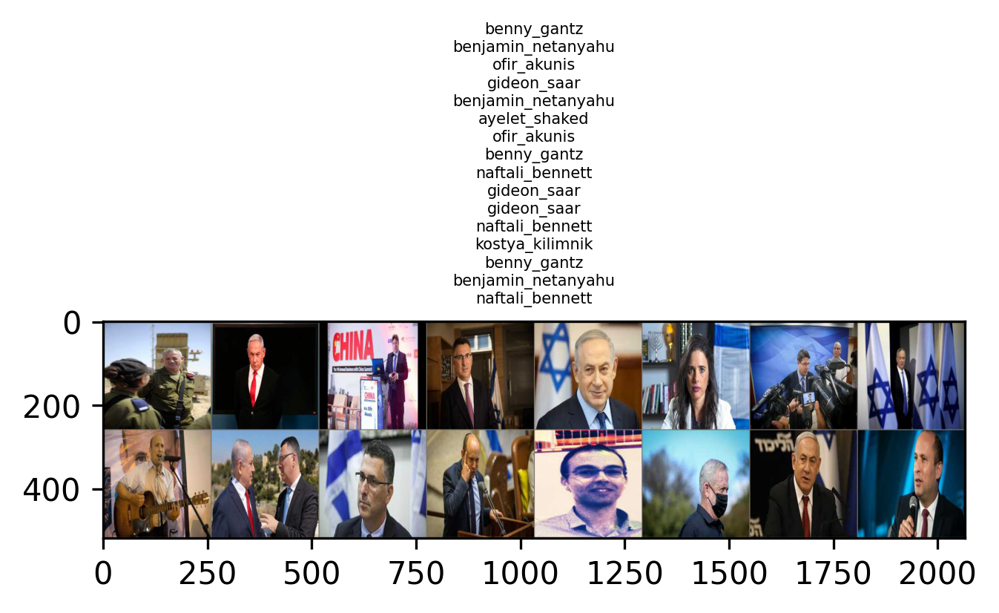

In [ ]:
# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=8)

imshow(out, title='\n'.join([class_names[x] for x in classes]))

### Using a pretrained model
Let's load a model pretrained on ImageNet, and use it for our task.  
We will use the VGG16 network, that won the ImageNet Challenge in 2016.

In [ ]:
# Hadas: Dowloaded the missing image
!wget https://production-media.paperswithcode.com/methods/vgg_7mT4DML.png
!mkdir img
!mv vgg_7mT4DML.png img/vgg_architecture.png

--2023-03-17 08:39:11--  https://production-media.paperswithcode.com/methods/vgg_7mT4DML.png
Resolving production-media.paperswithcode.com (production-media.paperswithcode.com)... 172.67.73.69, 104.26.12.155, 104.26.13.155, ...
Connecting to production-media.paperswithcode.com (production-media.paperswithcode.com)|172.67.73.69|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46325 (45K) [image/png]
Saving to: ‘vgg_7mT4DML.png’

vgg_7mT4DML.png     100%[===================>]  45.24K  --.-KB/s    in 0.002s  

2023-03-17 08:39:11 (23.6 MB/s) - ‘vgg_7mT4DML.png’ saved [46325/46325]



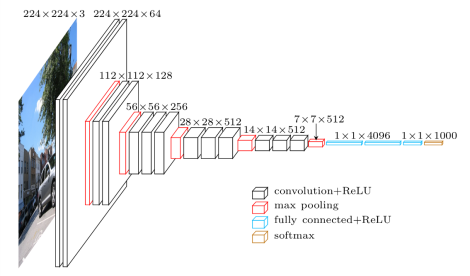

In [ ]:
from IPython import display
display.Image("./img/vgg_architecture.png")

The first time we load the model, it will be downloaded locally, and then cached for the future.

In [ ]:
# We load a pretrain model with its weights. Alternatively, one might want to only load the model architecture.
model = models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

We can print the model to learn about its structure as shown below.  
In future lessons, we will learn to read this output.  
For now, we can see that it is composed of 2D Convolution layers, non-linear ReLU activation, and 2D Max pooling, followed by a few fully connected layers. 

In [ ]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Keras has a useful model summary, that we can also use for PyTorch models:

In [ ]:
!pip install torchsummary 
from torchsummary import summary
summary(model.to(device), (3, 256, 256))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
    

We can see above that the final layer is a fully connected layer, from 4096 neurons to 1000 neurons, with a total of `4096 * 1000 + 1000 = 4,097,000` parameters. We add 1000 weights for the bias term of each output neuron.  

So in total, VGG-16 has 138M parameters, and we've set them all to be trainable.

However, VGG-16 and other networks created for ImageNet all have 1,000 neurons in their output, since they classify images to one of the 1,000 categories in the ImageNet challenge.  
To use the network for our task, we need to replace the final fully-connected layer with one mapping to 9 neurons instead of 1000:

In [ ]:
# This code should output the number of input neurons to the final layer. We'll use it to create a new layer instead of it.
last_layer = list(model.children())[-1]
if hasattr(last_layer, 'in_features'):
  num_ftrs = last_layer.in_features
else:
  num_ftrs = last_layer[-1].in_features

num_ftrs

4096

To access and set a layer in the network, we reference it by name. In the example above, the final layer is `model.classifier[6]`.

In [ ]:
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model.classifier[6]

Linear(in_features=4096, out_features=1000, bias=True)

Let's now replace it with a linear layer with 4096 input features and 9 output features:

In [ ]:
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)

Let's review our change in the model:

In [ ]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

Next, we define the loss, optimizer and LR scheduler.

In [ ]:
# If a GPU is available, make the model use it
model = model.to(device)

# For a multi-class problem, you'd usually prefer CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
# Momentum simulates the corase of a heavy ball, and keeps moving in the direction of the previous gradient along with the new gradient. 
# Empirically it is known to show better convergence. We will learn about it in future lessons.
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 10

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [ ]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, run=0):
    since = time.time()

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    running_loss_list_train_by_run = []
    running_loss_list_test_by_run = []
    running_loss_list_train = []
    running_loss_list_test = []
    running_acc_list_train = []
    running_acc_list_test = []


    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device) # H: movet to GPU
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer


                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                if phase == 'train':
                      running_loss_list_train_by_run.append(running_loss)
                if phase == 'val':
                      running_loss_list_test_by_run.append(running_loss)
            
                
            if phase == 'train':
                # Adjust the learning rate based on the scheduler
                scheduler.step()  
            

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'train':
                running_acc_list_train.append(epoch_acc.item())
                running_loss_list_train.append(epoch_loss)
            if phase == 'val':
                running_acc_list_test.append(epoch_acc.item())
                running_loss_list_test.append(epoch_loss)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())

# added checkpoint 16-03-23
           # Save the model checkpoint
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }
            model_name = model.__class__.__name__
            torch.save(checkpoint, f'{model_name}_checkpoint_{run}_{epoch}.pth')

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)

    loss_acc = {'running_loss_list_train_by_run': running_loss_list_train_by_run,
        'running_loss_list_test_by_run': running_loss_list_test_by_run,
        'running_loss_list_train': running_loss_list_train,
        'running_loss_list_test':running_loss_list_test,
        'running_acc_list_train':running_acc_list_train,
        'running_acc_list_test':running_acc_list_test
    }

    return model, loss_acc

## Finetuning the network




### Train and evaluate
It should take around 15-25 min on CPU. On GPU though, it takes less than a minute.

In [ ]:
model, loss_acc = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 1.8128 Acc: 0.3628
val Loss: 1.4185 Acc: 0.5128

Epoch 1/9
----------
train Loss: 1.0607 Acc: 0.6416
val Loss: 0.9594 Acc: 0.6880

Epoch 2/9
----------
train Loss: 0.7732 Acc: 0.7374
val Loss: 0.8839 Acc: 0.6838

Epoch 3/9
----------
train Loss: 0.3583 Acc: 0.8794
val Loss: 0.7724 Acc: 0.7479

Epoch 4/9
----------
train Loss: 0.1335 Acc: 0.9656
val Loss: 0.8272 Acc: 0.7650

Epoch 5/9
----------
train Loss: 0.1641 Acc: 0.9537
val Loss: 0.8743 Acc: 0.7479

Epoch 6/9
----------
train Loss: 0.0717 Acc: 0.9785
val Loss: 0.9684 Acc: 0.7521

Epoch 7/9
----------
train Loss: 0.0486 Acc: 0.9903
val Loss: 0.6825 Acc: 0.8120

Epoch 8/9
----------
train Loss: 0.0278 Acc: 0.9946
val Loss: 0.6562 Acc: 0.8205

Epoch 9/9
----------
train Loss: 0.0174 Acc: 0.9957
val Loss: 0.6664 Acc: 0.8248

Training complete in 4m 47s
Best val Acc: 0.824786


### Visualizing the model predictions

Let's define a generic function to display our model's predictions for a few images:




In [ ]:
def visualize_model(model, num_images=6):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1

                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)

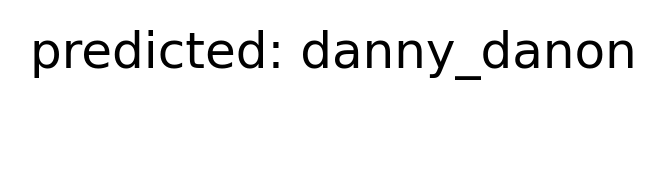

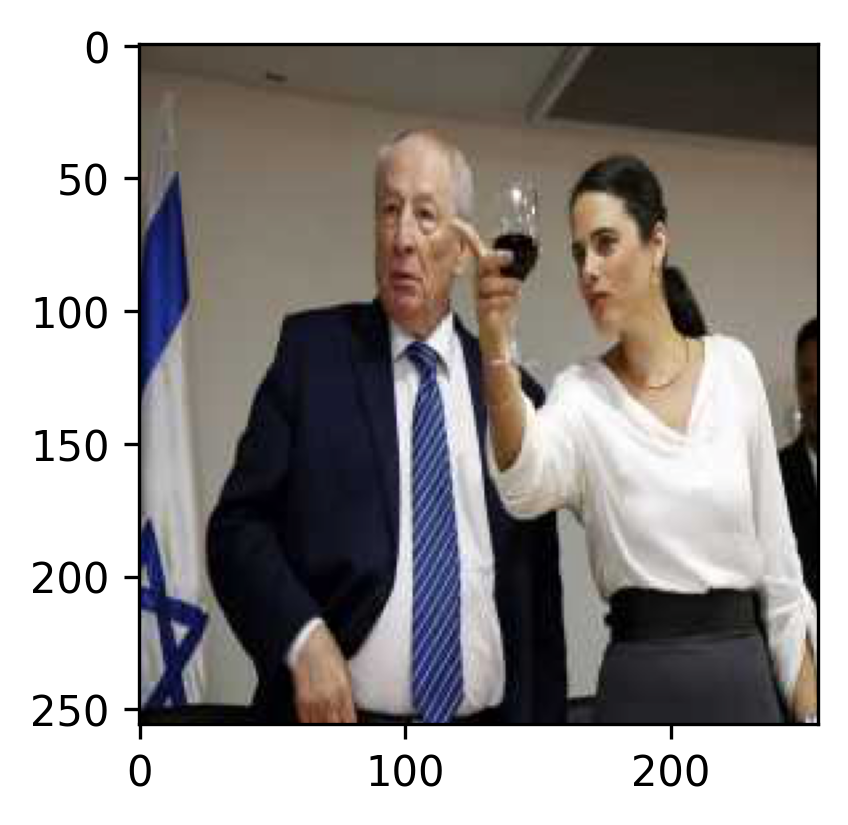

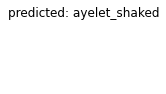

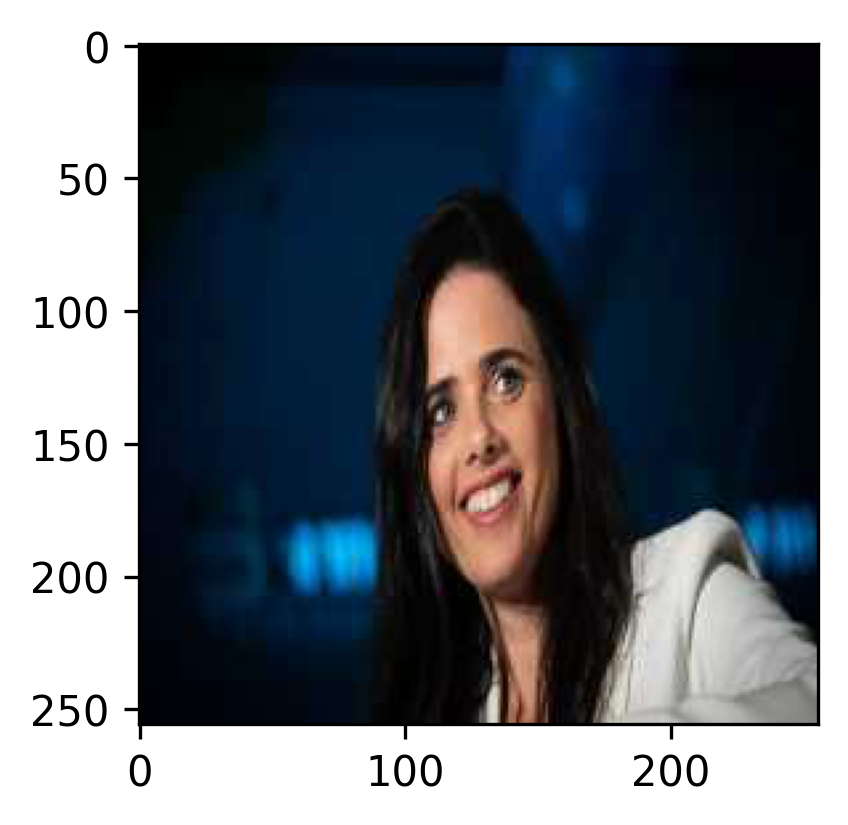

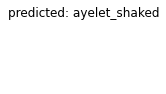

...

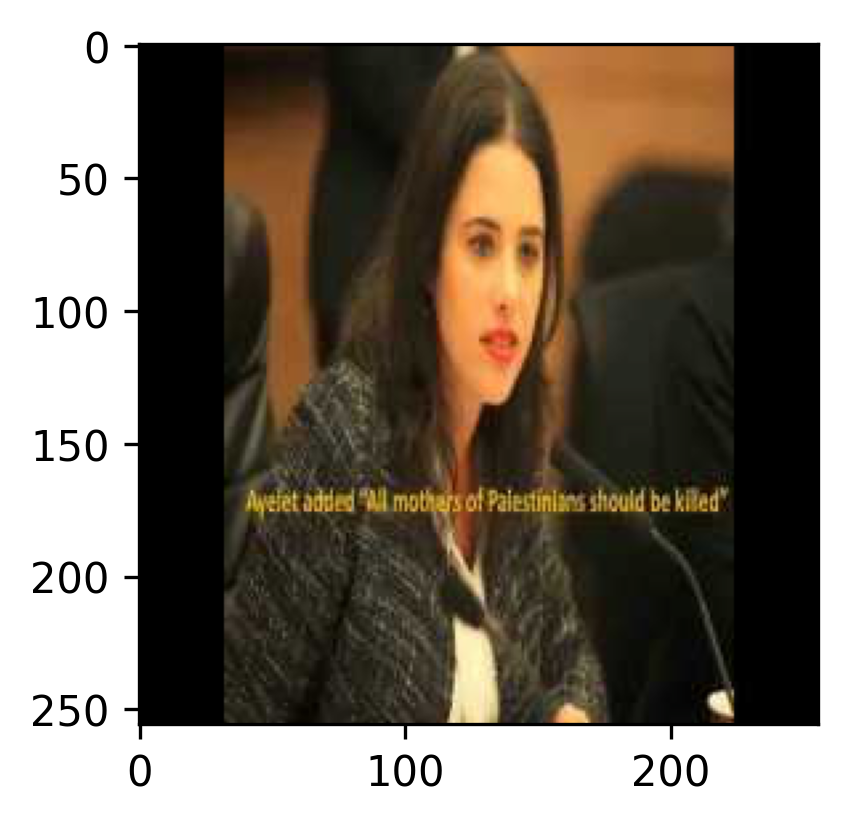

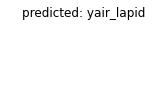

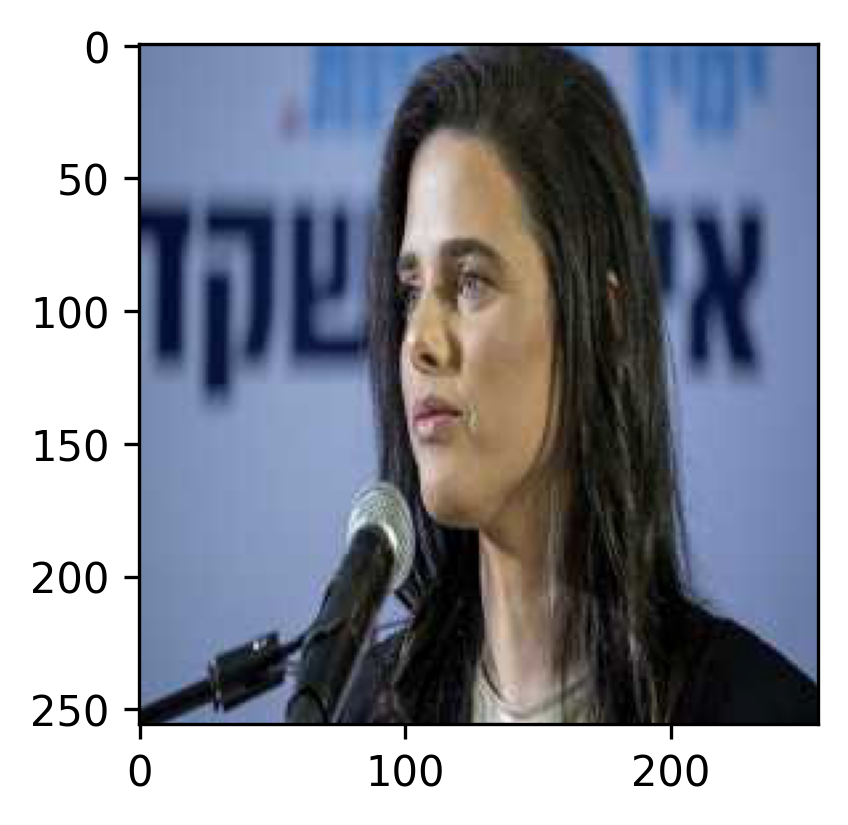

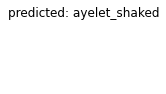

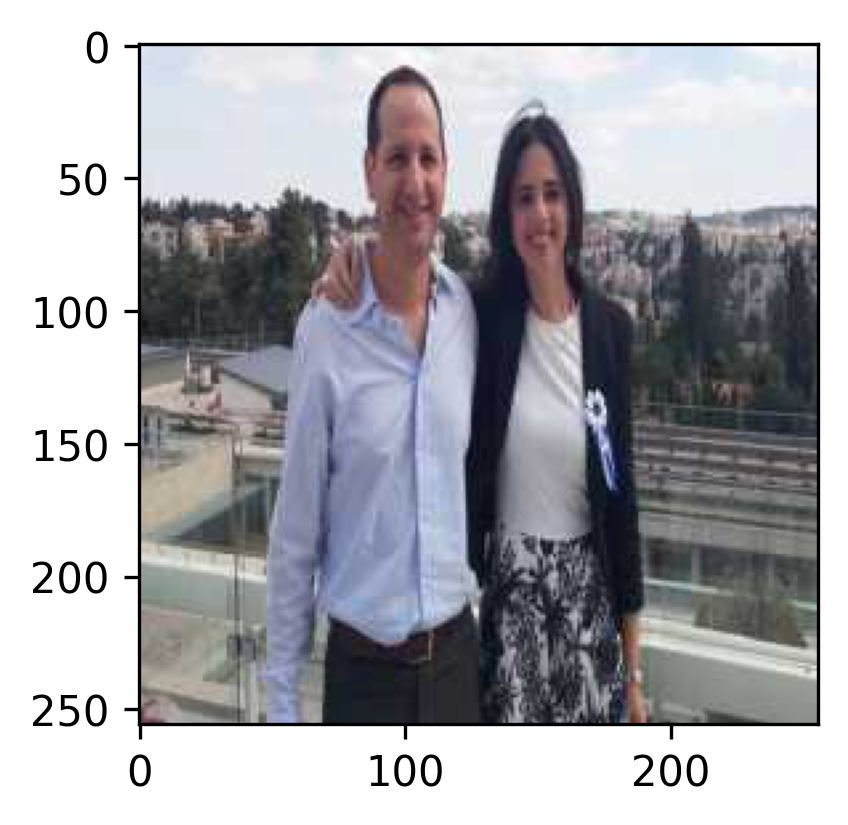

In [ ]:
visualize_model(model)

# Additional Tasks
In the sections below, you'll experiment with PyTorch and NN yourself.  

Before you start having fun on your own, let's review together how to get some predictions from our trained model.  

As we've done in both our training and visualization code, we apply the model to input with the command:  
```python
outputs = model(inputs)
```

The relevant code:

In [ ]:
type(inputs)

torch.Tensor

In [ ]:
inputs, labels = next(iter(dataloaders['train']))
inputs = inputs.to(device)
print(inputs)

labels = labels.to(device)
print(labels)

tensor([[[[-0.1143, -0.0801, -0.0458,  ..., -1.6555, -1.6384, -1.6384],
          [ 0.1426,  0.1768,  0.2282,  ..., -1.6555, -1.6384, -1.6384],
          [ 0.3652,  0.4337,  0.5193,  ..., -1.6555, -1.6384, -1.6384],
          ...,
          [ 0.1254, -0.0458, -0.2856,  ..., -1.6384, -1.6555, -1.6727],
          [ 0.6221,  0.4166,  0.0912,  ..., -1.6384, -1.6555, -1.6727],
          [-0.3198, -0.4054, -0.4739,  ..., -1.6384, -1.6555, -1.6727]],

         [[-0.7227, -0.6877, -0.6527,  ..., -1.5630, -1.5455, -1.5455],
          [-0.4426, -0.4076, -0.3550,  ..., -1.5630, -1.5455, -1.5455],
          [-0.2150, -0.1450, -0.0574,  ..., -1.5630, -1.5455, -1.5455],
          ...,
          [-0.1099, -0.4076, -0.8803,  ..., -1.5455, -1.5630, -1.5805],
          [ 0.2752, -0.0924, -0.6702,  ..., -1.5455, -1.5630, -1.5805],
          [-0.7577, -1.0028, -1.3529,  ..., -1.5455, -1.5630, -1.5805]],

         [[-0.9330, -0.8981, -0.8633,  ..., -1.3339, -1.3164, -1.3164],
          [-0.7064, -0.6715, -

Note that we got tensors. We can convert them into numpy objects. Since we've previously set them to use GPU, We'll need to set them to use CPU first:

In [ ]:
labels.cpu().numpy()

array([4, 0, 0, 7, 8, 1, 4, 3, 6, 4, 1, 0, 6, 0, 1, 3])

In [ ]:
outputs = model(inputs)

print(outputs.shape)
print(outputs)

torch.Size([16, 9])
tensor([[ -1.2188,  -1.3658,  -3.3933,   0.5127,   9.9634,  -1.4474,   0.0277,
          -1.3430,  -3.9752],
        [  6.3918,  -4.6930,  -2.4014,  -2.8775,  -0.3128,  -0.8876,   1.9189,
          -0.8928,   1.0009],
        [ 19.2506,  -3.7046, -10.6759,   1.5773,  -1.5450,  -0.9629,   2.9462,
         -10.5288,   0.1065],
        [ -6.7671,  -5.1773,  -5.0000,   2.6947,   3.2914,  -6.2708,  -4.7808,
          17.4260,   0.5321],
        [  1.1558,  -0.9131,  -3.1771,  -7.2696,   1.4233,  -2.4426,  -1.9432,
          -4.5320,  15.3987],
        [ -3.6587,  14.4058,  -0.6242,  -2.5641,   1.8385,  -5.9662,   0.2375,
          -3.1646,  -3.5609],
        [ -3.2472,  -1.5698,  -2.3598,  -1.5613,  10.8893,  -2.0801,  -1.4355,
          -2.1485,  -0.5432],
        [ -2.5198,  -3.9176,  -8.2525,   8.9694,   6.4886,  -7.3444,  -0.9161,
           3.5587,  -0.7419],
        [ -0.0814,   0.0408,   2.4048,  -1.8119,   0.3783,   0.8068,   9.9410,
          -6.7476,  -4.7482],

Note that `outputs` have 16 "rows", one for each of the images in our batch, and each "row" has 9 values, for each of our classes.  
The values are the activations of the neurons, before applying the softmax function to them. To apply the softmax function to them, we can run:

In [ ]:
torch.nn.functional.softmax(outputs, dim=1).cpu().detach().numpy()

array([[1.39162612e-05, 1.20140967e-05, 1.58191449e-06, 7.86201635e-05,
        9.99821365e-01, 1.10724432e-05, 4.84048469e-05, 1.22916263e-05,
        8.84026122e-07],
       [9.81513262e-01, 1.50598607e-05, 1.48953346e-04, 9.25302011e-05,
        1.20262371e-03, 6.76822732e-04, 1.12035684e-02, 6.73357805e-04,
        4.47379844e-03],
       [9.99999881e-01, 1.07318168e-10, 1.00715606e-13, 2.11151487e-08,
        9.30254540e-10, 1.66493752e-09, 8.30048208e-08, 1.16675820e-13,
        4.85087881e-09],
       [3.11231076e-11, 1.52579172e-10, 1.82184767e-10, 4.00203447e-07,
        7.26802398e-07, 5.11227345e-11, 2.26827751e-10, 9.99998927e-01,
        4.60330298e-08],
       [6.52227243e-07, 8.23959851e-08, 8.56316706e-09, 1.42988024e-10,
        8.52279754e-07, 1.78504393e-08, 2.94114315e-08, 2.20918817e-09,
        9.99998450e-01],
       [1.42793670e-08, 9.99995351e-01, 2.96875783e-07, 4.26670077e-08,
        3.48415688e-06, 1.42082623e-09, 7.02769739e-07, 2.34029667e-08,
        1.5

## Task 1: Plot model convergence
Adapt the code above to plot the loss and the accuracy every epoch. Show both the training and the validation performance.  
Does our model overfit?  
Do you have suggestions following these graphs? 

### Answer
We added to the above `train_model` a collection of the loss and accuracy.

Let's plot the loss, as it changes through the run

Text(0, 0.5, 'Loss')

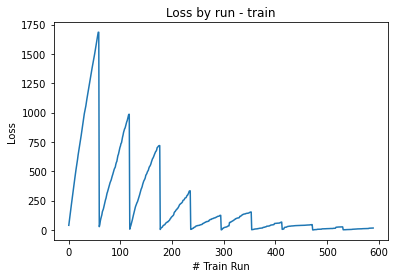

In [ ]:
plt.plot(loss_acc['running_loss_list_train_by_run'], label='running_loss_list_train_by_run')
plt.title('Loss by run - train')
plt.xlabel('# Train Run')
plt.ylabel('Loss')

Text(0, 0.5, 'Loss')

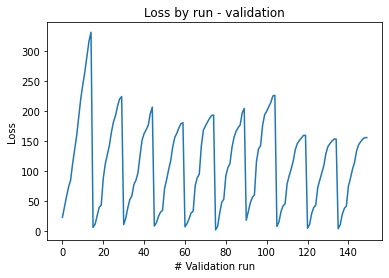

In [ ]:

plt.plot(loss_acc['running_loss_list_test_by_run'], label='running_loss_list_test_by_run')
plt.title('Loss by run - validation')
plt.xlabel('# Validation run')
plt.ylabel('Loss')

Text(0, 0.5, 'Loss')

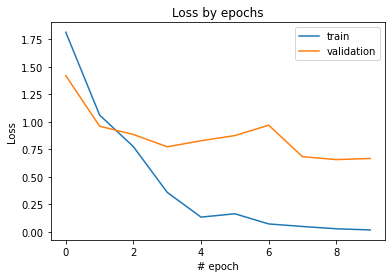

In [ ]:
plt.plot(loss_acc['running_loss_list_train'], label='train')
plt.plot(loss_acc['running_loss_list_test'], label='validation')
plt.legend()
plt.title('Loss by epochs')
plt.xlabel('# epoch')
plt.ylabel('Loss')

Text(0, 0.5, 'Accuracy')

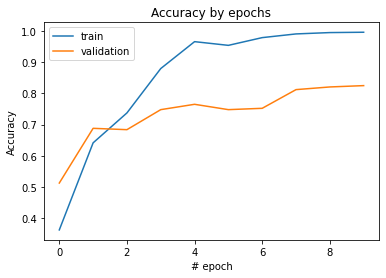

In [ ]:
plt.plot(loss_acc['running_acc_list_train'], label='train')
plt.plot(loss_acc['running_acc_list_test'], label='validation')
plt.legend()
plt.title('Accuracy by epochs')
plt.xlabel('# epoch')
plt.ylabel('Accuracy')

**Does our model overfit?**   
Yes, because from epoch 2 the train and validation accuracies doverge as the train accuracy gets close to 1, and validation accuracy stays around 0.8.

**Do you have suggestions following these graphs?**   


Maybe decrease the number of epochs, or to use an early stop rule, that will stop when the validation accuracy get worse.

## Task 2: Evaluate the model performance
Write code that shows the performance of our model.  
Show the classification report and the confusion matrix.  

What can you say about the model so far?  
Can you suggest a few ideas to improve it?

### Answer

Defining a function that predicts all the validation set

In [ ]:
def predict_labels(model, phase='val'):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    all_preds = []
    all_labels = []

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders[phase]):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds += preds.tolist()
            all_labels += labels.tolist()
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)
    
    return all_preds, all_labels

Let's use the above and define a funcion to predict and evaluate the results

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def eval_model(model, phase='val'):
    # Collecting the predictions 
    all_preds, all_labels = predict_labels(model, phase=phase)

    # Printing the classification report
    print(classification_report(all_labels, all_preds, target_names=class_names))

    # Plotting the confusion matrix
    fig, ax = plt.subplots()  #create figure and axes

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    #plt.xticks(ha="right", rotation=45)

    disp.plot(ax=ax)

    plt.setp(ax.get_xticklabels(), ha="right", rotation=45);
    fig.set_size_inches(8.5, 8.5)

    # Returning the confusion matrix
    return cm

Let's get prediction and evaluate the model using classification report and confusion matrix

                    precision    recall  f1-score   support

     ayelet_shaked       0.87      0.83      0.85        24
benjamin_netanyahu       0.80      0.81      0.80        58
       benny_gantz       0.65      0.50      0.56        22
       danny_danon       0.85      0.77      0.81        22
       gideon_saar       0.84      0.88      0.86        24
   kostya_kilimnik       1.00      1.00      1.00         3
   naftali_bennett       0.82      0.78      0.80        23
       ofir_akunis       0.82      0.94      0.88        34
        yair_lapid       0.92      1.00      0.96        24

          accuracy                           0.82       234
         macro avg       0.84      0.84      0.84       234
      weighted avg       0.82      0.82      0.82       234



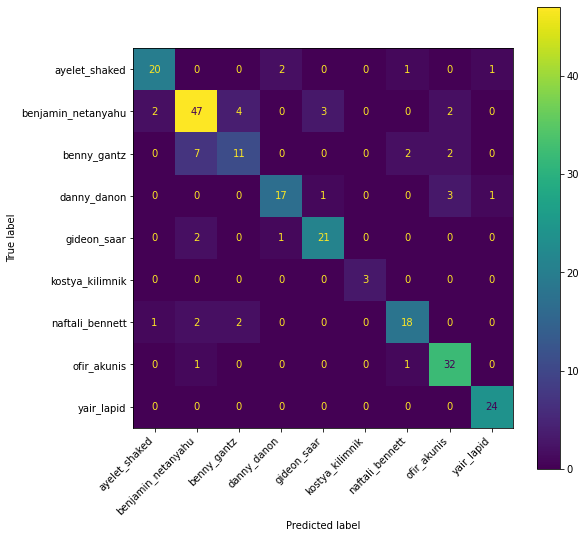

In [ ]:
cm = eval_model(model)

**What can you say about the model so far?**   
* Using the classification report we can see that some classes are classified more easily than others. For example, Benny Gantz's classification F1-score is 0.56, while Yair Lapid's F1-score is 0.96
* Using the support column, we can see that some classes have many examples, such as Benjamin Netanyahu who has 58 images, and some have much fewer, like Kostya Kilimnik.
* Using the confusion matrix, we can see that there is confusion between Benjamin Netanyahu and Benny Gantz, which are miss-classified as the other.
*  Using the confusion matrix, we see that most of the miss-classified images are classified as Benjamin Netanyahu.

**Can you suggest a few ideas to improve it?**   
1. Add more pictures of un-represented classes, like of Kostya.
2. Add more pictures of Benny Gantz, to allow the model to learn the differences between whim and Benjamin Netanyahu. 
3. Add more layers to the network, to allow it to learn the subtle differences between Gantz and Netanyahu.
4. Remove images of Benjamin Netanyahu to prevent bias towards this class.

## Task 3: Perform Error Analysis 
Error Analysis is an extremely important practice in Machine Learning research. It is rare that our base model works great out of the box. Proper error analysis helps us detect and fix issues in our DL code, data preprocessing and even in the data itself.

#### Review examples of top errors
One of the basic techniques of Error Analysis is manually reviewing the top errors of the model - samples where the model was most confident about one class, but the true label was different.  
Plot the top 10 errors of the model for each true class.  
Do you spot any issue or pattern?  
Try to see if you can improve the performance of the model following your insights.

Let's predict the labes and see which pair of classes are most likely to be confused with

In [ ]:
all_preds_train, all_labels_train = predict_labels(model, phase='train')
cm_train = confusion_matrix(all_labels_train, all_preds_train)

all_preds_val, all_labels_val = predict_labels(model, phase='val')
cm_val= confusion_matrix(all_labels_val, all_preds_val)

For each confusion matrix, let's fill the diagonal with $-1$, and find the largest value for each row, which is the most frequent wrong label.

For the train set

In [ ]:
temp_arr = cm_train.copy()
# Fill diagonal with -1
np.fill_diagonal(temp_arr, -1) 
# Find the indeces of the maximal value
error_ind = np.argmax(temp_arr, axis=1)
# Find the maximal value
error_val = np.max(temp_arr, axis=1)
for tl, wl in enumerate(error_ind):
    if error_val[tl] > 0:  # Print only false classifications exist
        print(f'{class_names[tl]}\t is usually wrongly classified as \t{class_names[wl]}')

ayelet_shaked	 is usually wrongly classified as 	naftali_bennett
naftali_bennett	 is usually wrongly classified as 	ayelet_shaked


For the validation set

In [ ]:
temp_arr = cm_val.copy()
# Fill diagonal with -1
np.fill_diagonal(temp_arr, -1) 
# Find the indeces of the maximal value
error_ind = np.argmax(temp_arr, axis=1)
# Find the maximal value
error_val = np.max(temp_arr, axis=1)
for tl, wl in enumerate(error_ind):
    if error_val[tl] > 0:  # Print only false classifications exist
        print(f'{class_names[tl]}\t\t is usually wrongly classified as \t{class_names[wl]}')

ayelet_shaked		 is usually wrongly classified as 	danny_danon
benjamin_netanyahu		 is usually wrongly classified as 	benny_gantz
benny_gantz		 is usually wrongly classified as 	benjamin_netanyahu
danny_danon		 is usually wrongly classified as 	ofir_akunis
gideon_saar		 is usually wrongly classified as 	benjamin_netanyahu
naftali_bennett		 is usually wrongly classified as 	benjamin_netanyahu
ofir_akunis		 is usually wrongly classified as 	benjamin_netanyahu


Let's plot the false classifications

In [ ]:
def visualize_error(model, phase, num_images=10):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()

    # For the flase-classified tensors
    error_dict = {
        0:[], 1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[]
    }
    # For the flase predictions
    error_dict_preds = {
        0:[], 1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[]
    }

    # For the losses
    error_dict_loss = {
        0:[], 1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[]
    }
    
    plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders[phase]):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)

            _, preds = torch.max(outputs, 1)

            for l, p, input, output in zip(labels, preds, inputs, outputs):
                if l != p:  # False prediction
                    loss = criterion(output, l)
                    # error_dict is a dicionary, where the keys are the true labels, and the values are lists of tensors
                    if len(error_dict[l.item()]) < 10: # Collecting the first 10
                        # Collecting the false-classified tensors
                        error_dict[l.item()].append(input)
                        # Collecting the wrong predictions
                        error_dict_preds[l.item()].append(class_names[p.item()])
                        # Collecting the loss
                        error_dict_loss[l.item()].append(loss.item())
        
        for lab, tensors in error_dict.items():
            if len(tensors) > 0:
                # Getting the worst 10 losses by sorting in descending order and taking the first 10 indeces
                loss_indxs = np.argsort(error_dict_loss[lab])[::-1][:10]
                error_preds = [error_dict_preds[lab][i] for i in loss_indxs]
                tens_to_plot = [tensors[i] for i in loss_indxs]
                #for idx in loss_indxs:
                title = f'True label: {class_names[lab]} | Predicted: {", ".join(error_preds)} (in decsending loss order)'
                # Make a grid from batch
                #tens_to_plot = tensors[loss_indxs]
                out = torchvision.utils.make_grid(tensors, nrow=5)
                imshow(out.cpu(), title=title)
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)


In [ ]:
#model = model[0]

<Figure size 600x300 with 0 Axes>

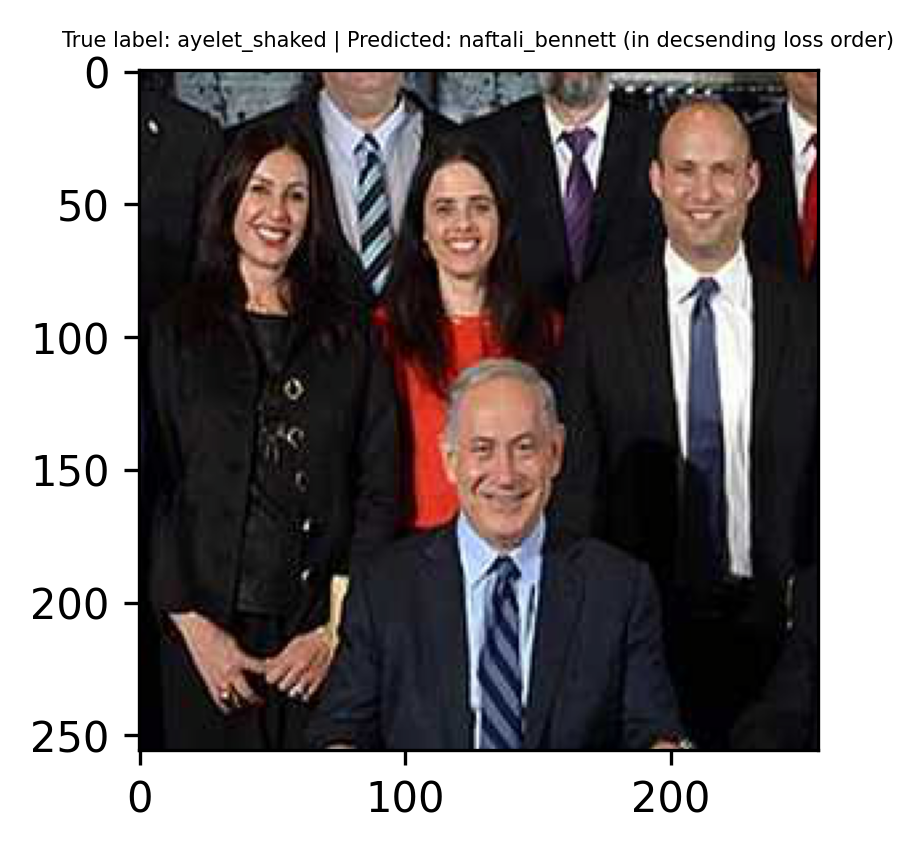

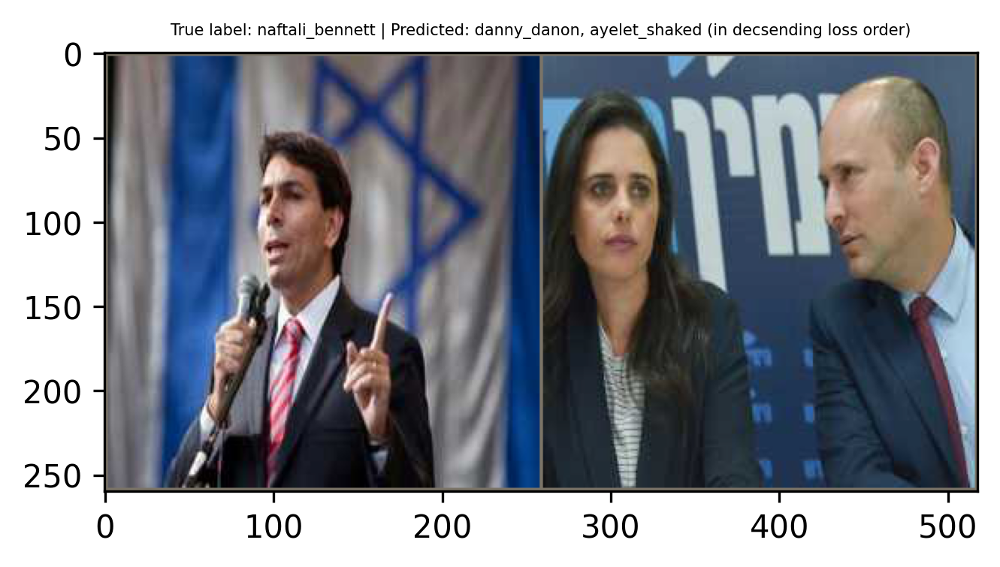

In [ ]:
visualize_error(model, 'train')

<Figure size 600x300 with 0 Axes>

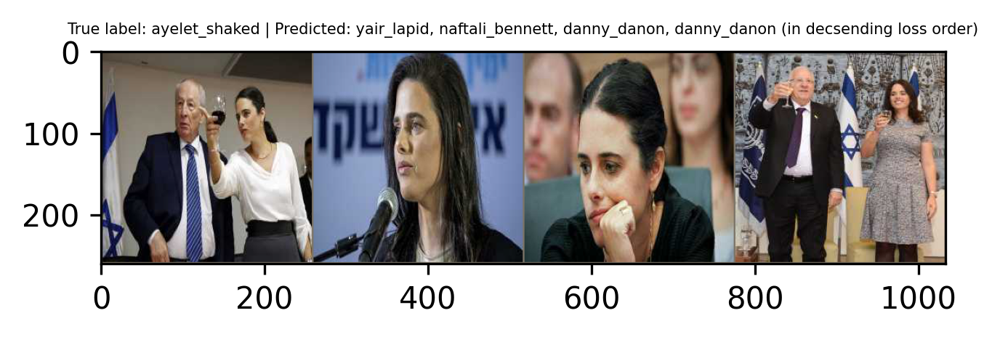

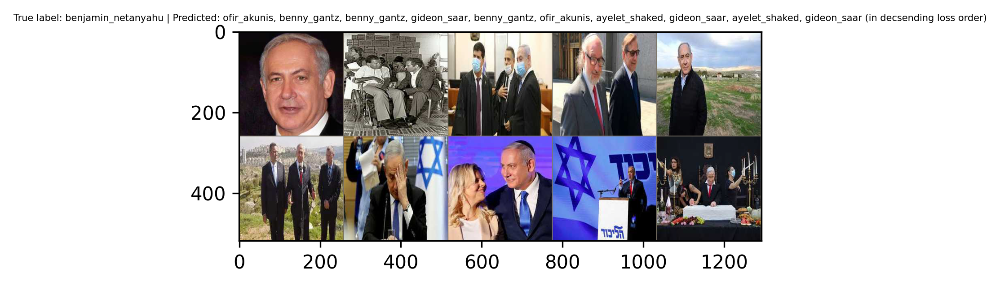

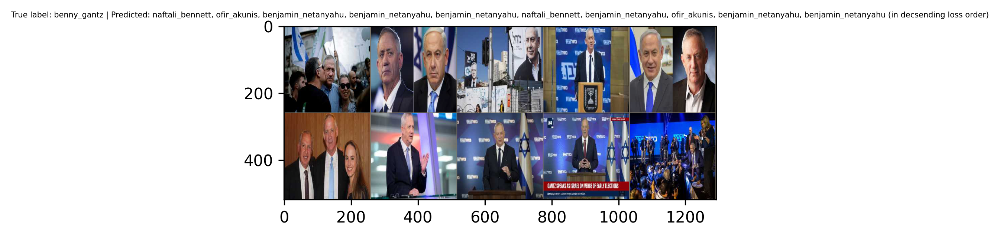

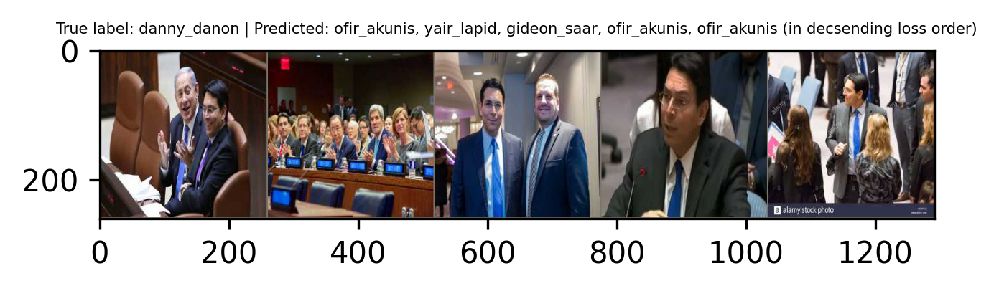

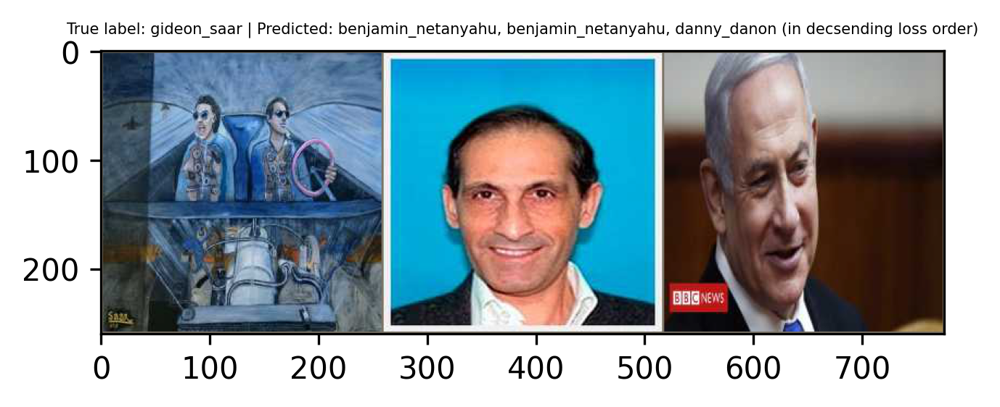

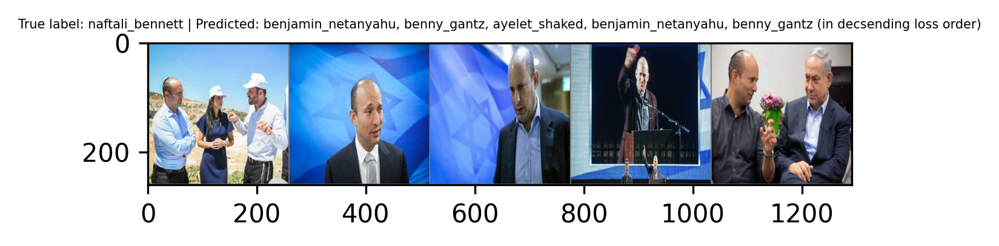

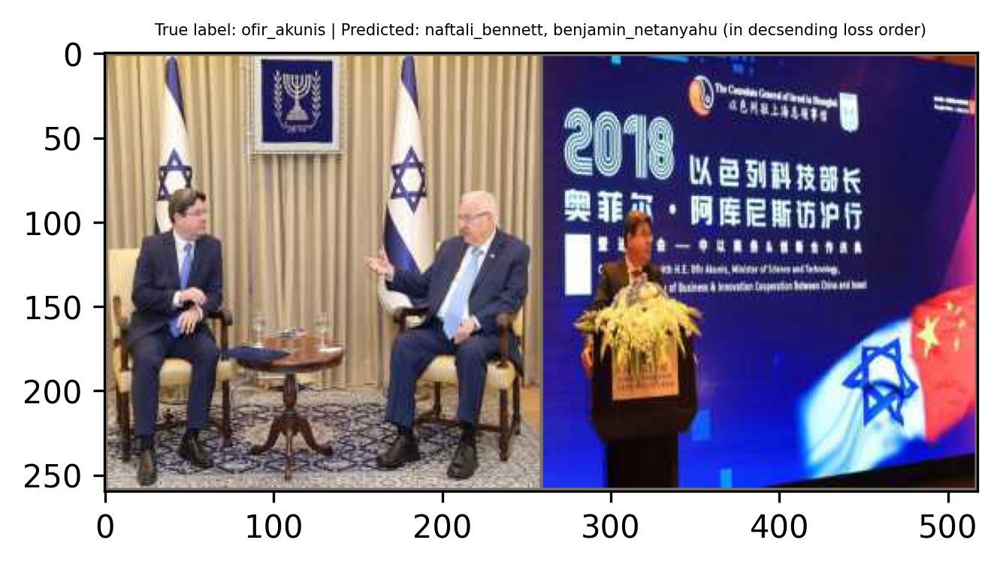

In [ ]:
visualize_error(model, 'val')

**Do you spot any issue or pattern?**    
We thought of several explainations:

1. There are much more images of Benjamin Netanyahu, relative to the other politicians and Y-data people. This can explain the bias toward false classifying other people as Netanyahu.
2. Many of the false classified images include multiple people, and therefore the false classification is not always false.
3. There are miss-labeled images, as the drawing of the two men inside a flying machine.
4. Some images represent old images, that are not very similar to the other pictures of the same person, as the black-and-white picture of Benjamin Netanyahu, of the picture of Yair Lapid with the cigarette.
5. Some labels have very few examples, as for Kostya.
6. Benny Gantz and Benjamin Netanyahu are quit similar.
7. Figures with Kipa and a flag are classified as Benjamin Netanyahu, probably because of the larger number of samples of Benjamin Netanyahu with these items, relative to other politicians.



**Try to see if you can improve the performance of the model following your insights.**   
We can take these actions:   
1. Balance the data by removing some of Binyamin Netanyahu images or use augmantation on the other politicians images.
2. Remove the figures with more than one person, or alternativly, switch the classification model to a model that identify presence of a pearson in an image, so that one image can be classified an 'including a person'.
3. Go over the labels and fix wrong labeling. 

## Task 4: Data Augmentation
Manually labeling can be expensive, both in terms of money and of time. Data augmentations serve to increase the amount of data available for the classifier without requiring labeling more images.  

The torch vision package allows easy augmentation of images using the data transforms.  
Use and adapt the code below to try different augmentations, and discuss the results and the model improvements you got from these augmentations.

[This guide](https://www.analyticsvidhya.com/blog/2019/12/image-augmentation-deep-learning-pytorch/) might help you along the way.

In [ ]:
def plot_acc_loss(loss_acc):
    fig2, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,4))

    #Plot the Accuracy
    ax1.plot(loss_acc['running_acc_list_train'], label='train')
    ax1.plot(loss_acc['running_acc_list_test'], label='validation')
    ax1.legend()
    ax1.set_title('Accuracy by epochs')
    ax1.set_xlabel('# epoch')
    ax1.set_ylabel('Accuracy')

    #Plot the loss
    ax2.plot(loss_acc['running_loss_list_train'], label='train')
    ax2.plot(loss_acc['running_loss_list_test'], label='validation')
    ax2.legend()
    ax2.set_title('Loss by epochs')
    ax2.set_xlabel('# epoch')
    ax2.set_ylabel('Loss')

In [ ]:
model.__class__.__name__
run = 0

In [ ]:
# Since our model was overfitted, we take the state of the model on the 1 epocs:
checkpoint = torch.load('VGG_checkpoint_0_0.pth')
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

Epoch 0/9
----------
train Loss: 1.1926 Acc: 0.6071
val Loss: 1.2029 Acc: 0.6111

Epoch 1/9
----------
train Loss: 0.9885 Acc: 0.6706
val Loss: 1.0886 Acc: 0.6197

Epoch 2/9
----------
train Loss: 0.9169 Acc: 0.6846
val Loss: 1.0242 Acc: 0.6538

Epoch 3/9
----------
train Loss: 0.7804 Acc: 0.7449
val Loss: 0.9005 Acc: 0.6923

Epoch 4/9
----------
train Loss: 0.6275 Acc: 0.7976
val Loss: 0.8952 Acc: 0.6880

Epoch 5/9
----------
train Loss: 0.6475 Acc: 0.7966
val Loss: 0.8923 Acc: 0.6923

Epoch 6/9
----------
train Loss: 0.6399 Acc: 0.7912
val Loss: 0.8865 Acc: 0.6966

Epoch 7/9
----------
train Loss: 0.6156 Acc: 0.8138
val Loss: 0.8800 Acc: 0.6838

Epoch 8/9
----------
train Loss: 0.5811 Acc: 0.8149
val Loss: 0.8772 Acc: 0.6966

Epoch 9/9
----------
train Loss: 0.6087 Acc: 0.8105
val Loss: 0.8675 Acc: 0.7009

Training complete in 4m 51s
Best val Acc: 0.700855


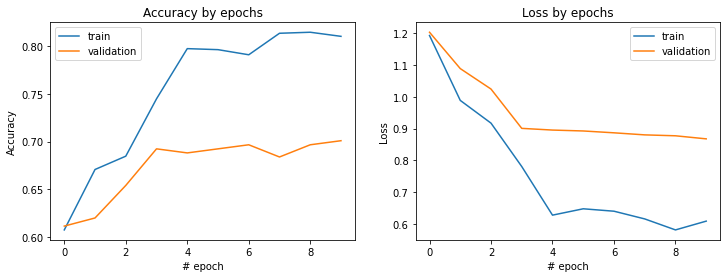

In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.RandomHorizontalFlip(),
        #transforms.RandomRotation(5),
        #transforms.ColorJitter(),
        #transforms.Grayscale(3),
        # transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders_aug_1 = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}

run += 1 # since we already run the model I add +1 so that we will be able to return the state fo the model
model, loss_acc  = train_model(model, 
                    dataloaders_aug_1,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                    num_epochs=num_epochs,
                    run=run) 


# for item in loss_acc:
#   loss_acc_added[item] = loss_acc_added[item] + loss_acc[item]

plot_acc_loss(loss_acc)

In [ ]:
# Since our model was overfitted, we take the state of the model before overfit:
checkpoint = torch.load('VGG_checkpoint_0_0.pth')
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

Epoch 0/9
----------
train Loss: 1.3392 Acc: 0.5490
val Loss: 1.3606 Acc: 0.5385

Epoch 1/9
----------
train Loss: 1.3008 Acc: 0.5533
val Loss: 1.3554 Acc: 0.5427

Epoch 2/9
----------
train Loss: 1.2926 Acc: 0.5716
val Loss: 1.3504 Acc: 0.5470

Epoch 3/9
----------
train Loss: 1.2646 Acc: 0.5845
val Loss: 1.3457 Acc: 0.5556

Epoch 4/9
----------
train Loss: 1.2571 Acc: 0.5705
val Loss: 1.3415 Acc: 0.5513

Epoch 5/9
----------
train Loss: 1.2720 Acc: 0.5748
val Loss: 1.3375 Acc: 0.5513

Epoch 6/9
----------
train Loss: 1.2488 Acc: 0.5974
val Loss: 1.3339 Acc: 0.5513

Epoch 7/9
----------
train Loss: 1.2353 Acc: 0.6050
val Loss: 1.3303 Acc: 0.5470

Epoch 8/9
----------
train Loss: 1.2364 Acc: 0.6017
val Loss: 1.3300 Acc: 0.5470

Epoch 9/9
----------
train Loss: 1.2292 Acc: 0.5963
val Loss: 1.3297 Acc: 0.5470

Training complete in 4m 54s
Best val Acc: 0.555556


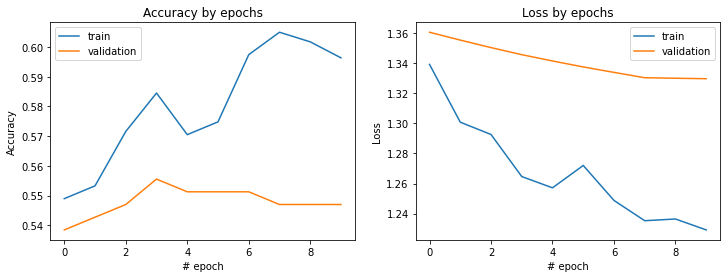

In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        #transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(0.5),
        transforms.ColorJitter(brightness=.1, hue=.1),
        #transforms.Grayscale(3),
        #transforms.GaussianBlur(sigma=1)
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders_aug_2 = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}

run += 1
model, loss_acc  = train_model(model, 
                    dataloaders_aug_2,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                    num_epochs=num_epochs,
                    run=run)


plot_acc_loss(loss_acc)


In [ ]:
# Since our model was overfitted, we take the state of the model before overfit:
checkpoint = torch.load('VGG_checkpoint_0_2.pth')
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

Epoch 0/9
----------
train Loss: 0.5125 Acc: 0.8235
val Loss: 0.8828 Acc: 0.6838

Epoch 1/9
----------
train Loss: 0.5247 Acc: 0.8149
val Loss: 0.8814 Acc: 0.6838

Epoch 2/9
----------
train Loss: 0.4891 Acc: 0.8149
val Loss: 0.8800 Acc: 0.6838

Epoch 3/9
----------
train Loss: 0.5118 Acc: 0.8213
val Loss: 0.8787 Acc: 0.6838

Epoch 4/9
----------
train Loss: 0.5019 Acc: 0.8245
val Loss: 0.8774 Acc: 0.6880

Epoch 5/9
----------
train Loss: 0.4911 Acc: 0.8256
val Loss: 0.8773 Acc: 0.6880

Epoch 6/9
----------
train Loss: 0.5009 Acc: 0.8235
val Loss: 0.8772 Acc: 0.6880

Epoch 7/9
----------
train Loss: 0.4957 Acc: 0.8170
val Loss: 0.8771 Acc: 0.6880

Epoch 8/9
----------
train Loss: 0.5049 Acc: 0.8030
val Loss: 0.8771 Acc: 0.6880

Epoch 9/9
----------
train Loss: 0.5339 Acc: 0.8127
val Loss: 0.8770 Acc: 0.6880

Training complete in 4m 53s
Best val Acc: 0.688034


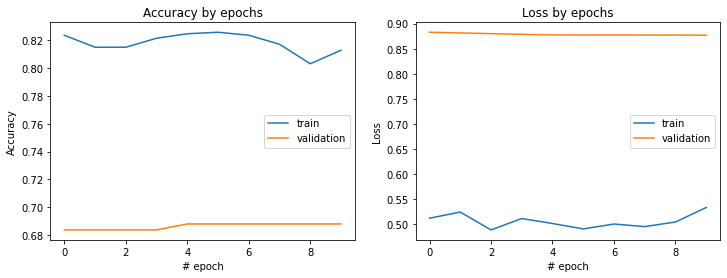

In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        #transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(0.5),
        transforms.ColorJitter(brightness=.1, hue=.1),
        #transforms.Grayscale(3),
        #transforms.GaussianBlur(sigma=1)
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders_aug_2 = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}

run += 1
model, loss_acc  = train_model(model, 
                    dataloaders_aug_2,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                    num_epochs=num_epochs,
                    run=run)


plot_acc_loss(loss_acc)


Comments for Task 4:

This model is tend to overtrain quickly. Trying to show some additional data (data that was augmentated differenly) is help on some run and not on the others and still we quickly get overtrain model.

From different augmentations that was tryed on this data set, those works in terms of getting less loss, but not overfit:

- RandomHorizontalFlip()
- RandomRotation(0.5) + ColorJitter(brightness=.1, hue=.1)

And those (different params were tried) wasn't succesfull:

- Grayscale() 
- GaussianBlur()
- RandomRotation()

And here some examples of how pictures are changed in those augmentation process:

Credits to the code: https://pytorch.org/vision/main/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py

In [ ]:
from PIL import Image
orig_img = Image.open('/content/data/israeli_politicians/train/ayelet_shaked/image003.jpg')

def plot(imgs, with_orig=True, row_title=None, suptitle=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    if suptitle is not None: 
      plt.suptitle(suptitle, y=0.25)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

      
    plt.tight_layout()

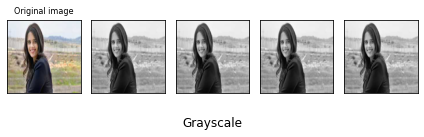

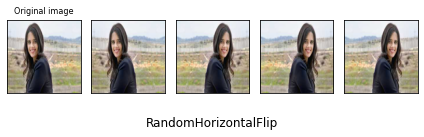

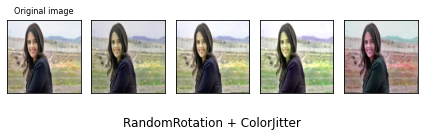

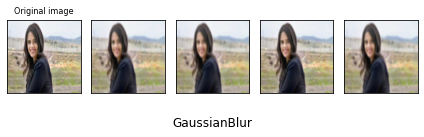

In [ ]:
num_trabsoformed_img = 4

transformed_imgs = [transforms.Grayscale(3)(orig_img) for _ in range(num_trabsoformed_img)]
plot([transformed_imgs], cmap='gray', suptitle='Grayscale')

transformed_imgs = [transforms.RandomHorizontalFlip()(orig_img) for _ in range(num_trabsoformed_img)]
plot([transformed_imgs], suptitle='RandomHorizontalFlip')


rotate_color = transforms.Compose([
        transforms.RandomRotation(0.5),
        transforms.ColorJitter(brightness=.1, hue=.1),
    ])
transformed_imgs = [rotate_color(orig_img) for _ in range(num_trabsoformed_img)]
plot([transformed_imgs], suptitle='RandomRotation + ColorJitter')


transformed_imgs = [transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))(orig_img) for _ in range(num_trabsoformed_img)]
plot([transformed_imgs], suptitle='GaussianBlur')

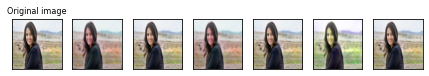

In [ ]:
transformed_imgs = [transforms.RandomApply(torch.nn.ModuleList([
                              transforms.RandomHorizontalFlip(),
                              transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
                              transforms.ColorJitter(brightness=.1, hue=.1),
                              transforms.RandomRotation(0.5)
                             ]), p=0.75)(orig_img) for _ in range(6)]
plot([transformed_imgs])

Update after the lecture with random augmentation.

Epoch 0/9
----------
train Loss: 1.8690 Acc: 0.3132
val Loss: 1.6292 Acc: 0.4658

Epoch 1/9
----------
train Loss: 1.3517 Acc: 0.5081
val Loss: 1.3119 Acc: 0.5000

Epoch 2/9
----------
train Loss: 1.1565 Acc: 0.5888
val Loss: 1.1745 Acc: 0.5897

Epoch 3/9
----------
train Loss: 0.9032 Acc: 0.6814
val Loss: 0.8186 Acc: 0.7137

Epoch 4/9
----------
train Loss: 0.6164 Acc: 0.8019
val Loss: 0.7350 Acc: 0.7607

Epoch 5/9
----------
train Loss: 0.3935 Acc: 0.8622
val Loss: 1.4379 Acc: 0.6111

Epoch 6/9
----------
train Loss: 1.0468 Acc: 0.6631
val Loss: 0.8196 Acc: 0.7009

Epoch 7/9
----------
train Loss: 0.3854 Acc: 0.8741
val Loss: 0.7302 Acc: 0.7564

Epoch 8/9
----------
train Loss: 0.3155 Acc: 0.9064
val Loss: 0.7300 Acc: 0.7521

Epoch 9/9
----------
train Loss: 0.2784 Acc: 0.9128
val Loss: 0.7280 Acc: 0.7564

Training complete in 4m 57s
Best val Acc: 0.760684


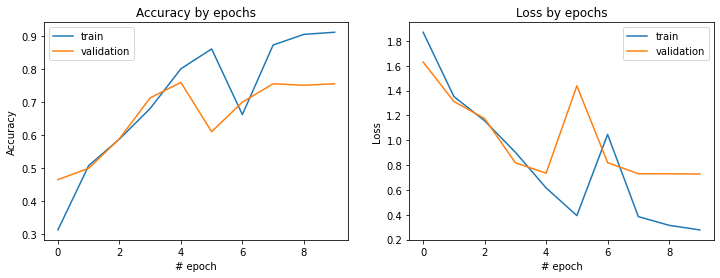

In [ ]:
# Data augmentation and normalization for training
from torchvision import transforms
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.RandomApply(nn.ModuleList([
                              transforms.RandomHorizontalFlip(),
                              transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
                              transforms.ColorJitter(brightness=.1, hue=.1),
                              transforms.RandomRotation(0.5)
                             ]), p=0.75),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

transforms = transforms.RandomApply(torch.nn.ModuleList([
    transforms.ColorJitter(),
]), p=0.3)
scripted_transforms = torch.jit.script(transforms)

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders_aug_3 = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}

# run += 1 # since we already run the model I add +1 so that we will be able to return the state fo the model
model_aug, loss_acc_aug  = train_model(model, 
                    dataloaders_aug_3,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                    num_epochs=num_epochs,
                    run=10) #since I will not rerun all the code 


plot_acc_loss(loss_acc_aug)

This run imporouve the result of the model!

## Task 5: Model Architectures
In the course we'll cover in depth various DL architectures suggested to perform image classification. Among other things, these networks differ in depth (the number of layers), the number of weights (the network power), the composing layers, and more.  
In the figure below, you can see the performance of different network architectures on the ImageNet Image Classification task, and the number of flops (atomic computations) required for them. 

![CNN performance/flops graph](https://miro.medium.com/max/1838/1*n16lj3lSkz2miMc_5cvkrA.jpeg)

### Resnext

#### 50_32x4d

In [ ]:
resnext50 = models.resnext50_32x4d(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth


  0%|          | 0.00/95.8M [00:00<?, ?B/s]

In [ ]:
#summary(resnext50.to(device), (3, 256, 256))

In [ ]:
resnext50.fc

Linear(in_features=2048, out_features=1000, bias=True)

In [ ]:
# set that we have 9 outouts
resnext50.fc = nn.Linear(in_features=2048, out_features=9)

# to GPU
resnext50 = resnext50.to(device)
 
# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
# Momentum simulates the corase of a heavy ball, and keeps moving in the direction of the previous gradient along with the new gradient. 
# Empirically it is known to show better convergence. We will learn about it in future lessons.
optimizer_ft = optim.SGD(resnext50.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 10

Epoch 0/9
----------
train Loss: 1.8187 Acc: 0.3811
val Loss: 1.4356 Acc: 0.4872

Epoch 1/9
----------
train Loss: 0.8972 Acc: 0.7427
val Loss: 0.7837 Acc: 0.7607

Epoch 2/9
----------
train Loss: 0.3678 Acc: 0.9139
val Loss: 0.5819 Acc: 0.8248

Epoch 3/9
----------
train Loss: 0.1698 Acc: 0.9752
val Loss: 0.5072 Acc: 0.8162

Epoch 4/9
----------
train Loss: 0.0775 Acc: 0.9914
val Loss: 0.4845 Acc: 0.8291

Epoch 5/9
----------
train Loss: 0.0570 Acc: 0.9946
val Loss: 0.4796 Acc: 0.8333

Epoch 6/9
----------
train Loss: 0.0488 Acc: 0.9925
val Loss: 0.4562 Acc: 0.8376

Epoch 7/9
----------
train Loss: 0.0406 Acc: 0.9946
val Loss: 0.4565 Acc: 0.8419

Epoch 8/9
----------
train Loss: 0.0408 Acc: 0.9925
val Loss: 0.4794 Acc: 0.8419

Epoch 9/9
----------
train Loss: 0.0304 Acc: 0.9925
val Loss: 0.4617 Acc: 0.8376

Training complete in 3m 21s
Best val Acc: 0.841880


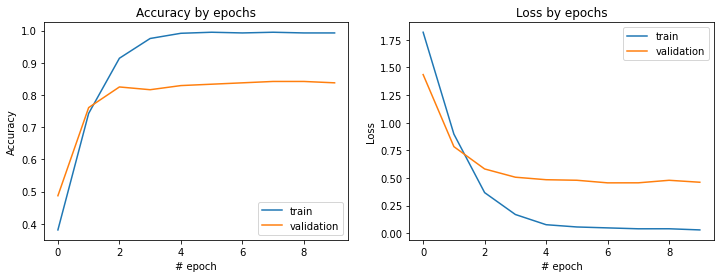

In [ ]:
resnext50, resnext50_loss_acc = train_model(resnext50, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

plot_acc_loss(resnext50_loss_acc)

Let's try to stop after 1 Epoch and add some augmination data

In [ ]:
resnext50.__class__.__name__

'ResNet'

In [ ]:
checkpoint = torch.load('ResNet_checkpoint_0_1.pth')
resnext50.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [ ]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        #transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(0.5),
        transforms.ColorJitter(brightness=.1, hue=.1),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders_aug_2 = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}

Epoch 0/9
----------
train Loss: 0.5386 Acc: 0.8870
val Loss: 0.7765 Acc: 0.7564

Epoch 1/9
----------
train Loss: 0.4924 Acc: 0.8934
val Loss: 0.7192 Acc: 0.7949

Epoch 2/9
----------
train Loss: 0.4236 Acc: 0.9225
val Loss: 0.7054 Acc: 0.7863

Epoch 3/9
----------
train Loss: 0.3924 Acc: 0.9236
val Loss: 0.6684 Acc: 0.7906

Epoch 4/9
----------
train Loss: 0.3755 Acc: 0.9300
val Loss: 0.6670 Acc: 0.8077

Epoch 5/9
----------
train Loss: 0.3736 Acc: 0.9290
val Loss: 0.6718 Acc: 0.7863

Epoch 6/9
----------
train Loss: 0.3673 Acc: 0.9290
val Loss: 0.6692 Acc: 0.7991

Epoch 7/9
----------
train Loss: 0.3638 Acc: 0.9343
val Loss: 0.6496 Acc: 0.8077

Epoch 8/9
----------
train Loss: 0.3739 Acc: 0.9279
val Loss: 0.6637 Acc: 0.7949

Epoch 9/9
----------
train Loss: 0.3491 Acc: 0.9343
val Loss: 0.6547 Acc: 0.8077

Training complete in 3m 27s
Best val Acc: 0.807692


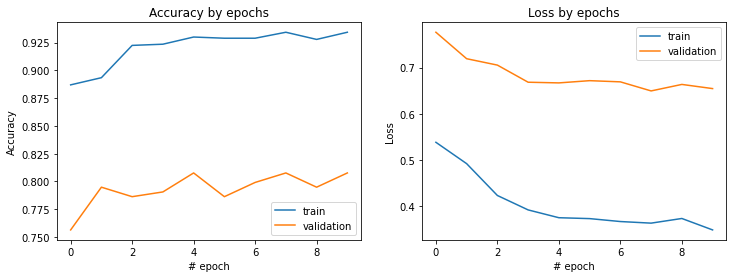

In [ ]:
resnext50, resnext50_loss_acc = train_model(resnext50, 
                    dataloaders_aug_2,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

plot_acc_loss(resnext50_loss_acc)

That wasn't successfull try, let's use different augmination:

In [ ]:
checkpoint = torch.load('ResNet_checkpoint_0_1.pth')
resnext50.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders_hf = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}


Epoch 0/9
----------
train Loss: 0.4403 Acc: 0.9053
val Loss: 0.7130 Acc: 0.8077

Epoch 1/9
----------
train Loss: 0.4188 Acc: 0.9214
val Loss: 0.7103 Acc: 0.7906

Epoch 2/9
----------
train Loss: 0.4192 Acc: 0.9214
val Loss: 0.7208 Acc: 0.7906

Epoch 3/9
----------
train Loss: 0.4233 Acc: 0.9182
val Loss: 0.7064 Acc: 0.7906

Epoch 4/9
----------
train Loss: 0.4316 Acc: 0.9171
val Loss: 0.6949 Acc: 0.7991

Epoch 5/9
----------
train Loss: 0.4449 Acc: 0.9064
val Loss: 0.7064 Acc: 0.7991

Epoch 6/9
----------
train Loss: 0.4239 Acc: 0.9203
val Loss: 0.7119 Acc: 0.8077

Epoch 7/9
----------
train Loss: 0.4268 Acc: 0.9117
val Loss: 0.7140 Acc: 0.7863

Epoch 8/9
----------
train Loss: 0.4193 Acc: 0.9311
val Loss: 0.7294 Acc: 0.7778

Epoch 9/9
----------
train Loss: 0.4454 Acc: 0.9150
val Loss: 0.7040 Acc: 0.7906

Training complete in 3m 23s
Best val Acc: 0.807692


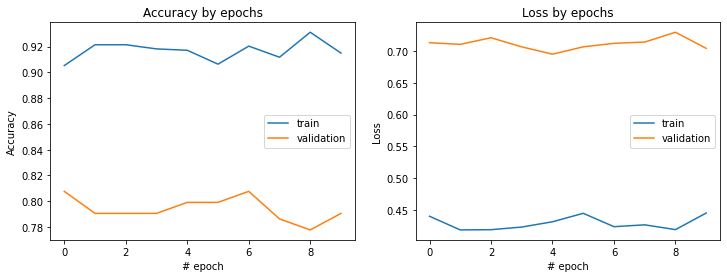

In [ ]:
resnext50, resnext50_loss_acc = train_model(resnext50, 
                    dataloaders_hf,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

plot_acc_loss(resnext50_loss_acc)

This is also became overtrained model

#### 101_32x8d

In [ ]:
resnext101 = models.resnext101_32x8d(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth" to /root/.cache/torch/hub/checkpoints/resnext101_32x8d-8ba56ff5.pth


  0%|          | 0.00/340M [00:00<?, ?B/s]

In [ ]:
resnext101.fc

Linear(in_features=2048, out_features=1000, bias=True)

In [ ]:
# set that we have 9 outouts
resnext101.fc = nn.Linear(in_features=2048, out_features=9)

# to GPU
resnext101 = resnext101.to(device)
 
# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
# Momentum simulates the corase of a heavy ball, and keeps moving in the direction of the previous gradient along with the new gradient. 
# Empirically it is known to show better convergence. We will learn about it in future lessons.
optimizer_ft = optim.SGD(resnext101.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 5

Epoch 0/4
----------
train Loss: 1.7055 Acc: 0.4166
val Loss: 1.1036 Acc: 0.6538

Epoch 1/4
----------
train Loss: 0.6413 Acc: 0.8278
val Loss: 0.5530 Acc: 0.8162

Epoch 2/4
----------
train Loss: 0.2012 Acc: 0.9645
val Loss: 0.4512 Acc: 0.8632

Epoch 3/4
----------
train Loss: 0.0971 Acc: 0.9806
val Loss: 0.4270 Acc: 0.8590

Epoch 4/4
----------
train Loss: 0.0625 Acc: 0.9903
val Loss: 0.3845 Acc: 0.8761

Training complete in 5m 58s
Best val Acc: 0.876068


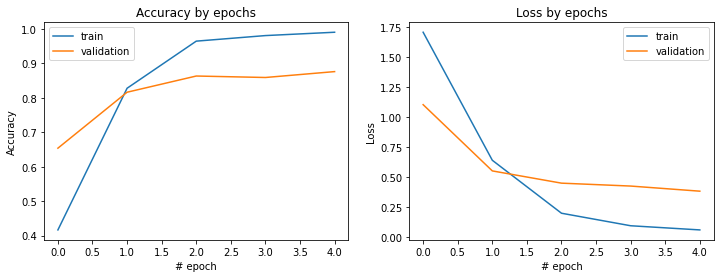

In [ ]:
resnext101, resnext101_loss_acc = train_model(resnext101, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

plot_acc_loss(resnext101_loss_acc)

In our code above we've used the `VGG` architecture.  
See if you can increase model performance by using alternative architectures from [torchvision.models](https://pytorch.org/vision/0.8/models.html).  
Pay attention to the input dimensions that each network architecture expects.

### Densenet

In [ ]:
#Load the model and set it to GPU
densenet = models.densenet169(pretrained=True)

Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth


  0%|          | 0.00/54.7M [00:00<?, ?B/s]

In [ ]:
densenet.classifier

Linear(in_features=1664, out_features=1000, bias=True)

In [ ]:
# set that we have 9 outouts
densenet.classifier = nn.Linear(in_features=1664, out_features=9)

# to GPU
densenet = densenet.to(device)
 
# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
# Momentum simulates the corase of a heavy ball, and keeps moving in the direction of the previous gradient along with the new gradient. 
# Empirically it is known to show better convergence. We will learn about it in future lessons.
optimizer_ft = optim.SGD(densenet.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 10

Epoch 0/9
----------
train Loss: 1.8386 Acc: 0.3369
val Loss: 1.4180 Acc: 0.5513

Epoch 1/9
----------
train Loss: 1.0170 Acc: 0.7234
val Loss: 0.9404 Acc: 0.6624

Epoch 2/9
----------
train Loss: 0.5180 Acc: 0.8654
val Loss: 0.7079 Acc: 0.7650

Epoch 3/9
----------
train Loss: 0.2566 Acc: 0.9537
val Loss: 0.5693 Acc: 0.7991

Epoch 4/9
----------
train Loss: 0.1312 Acc: 0.9828
val Loss: 0.5071 Acc: 0.8291

Epoch 5/9
----------
train Loss: 0.0979 Acc: 0.9871
val Loss: 0.5032 Acc: 0.8248

Epoch 6/9
----------
train Loss: 0.0643 Acc: 0.9946
val Loss: 0.4869 Acc: 0.8376

Epoch 7/9
----------
train Loss: 0.0420 Acc: 0.9968
val Loss: 0.5411 Acc: 0.8291

Epoch 8/9
----------
train Loss: 0.0403 Acc: 0.9968
val Loss: 0.5192 Acc: 0.8291

Epoch 9/9
----------
train Loss: 0.0372 Acc: 0.9946
val Loss: 0.4843 Acc: 0.8376

Training complete in 3m 24s
Best val Acc: 0.837607


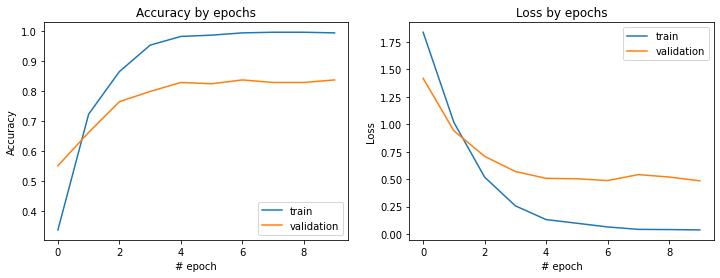

In [ ]:
densenet, densenet_loss_acc = train_model(densenet, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

plot_acc_loss(densenet_loss_acc)

### Answer (Results)

Best results before overfitting:

- Loss: 1.1293 Acc: 0.6197; Model = vgg16
- Loss: 0.8186 Acc: 0.7137; Model = vgg16 + augmentaion
- Loss: 0.7450 Acc: 0.7650; Model = Resnext_50_32x4d
- Loss: 0.5427 Acc: 0.8291; Model = Resnext_101_32x6d
- Loss: 0.9786 Acc: 0.7009; Model = Densenet


So, in our runs be got the best result using pretrained Resnext_101_32x6d


## (bonus) Task 6: Design your own Neural Network Architecture
Take a stab at building your own NN architecture.  
To allow you to experiment quickly, we'll limit it to 8 layers max, and up to 10 million parameters. Use [this PyTorch guide](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html) for reference.  
Train it only on our provided images - we'll present the winner with the best results on the validation set!

### First try

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
import torch.nn.functional as F

class TH_Net1(nn.Module):

    def __init__(self):
        super(TH_Net1, self).__init__()
        # 1 input image channel, 6 output channels, 5x5 square convolution
        # kernel
        self.conv1 = nn.Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))
        
        self.conv2 = nn.Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.relu2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))

        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(in_features=256*256, out_features=512, bias=True)
        self.fc2 = nn.Linear(in_features=512, out_features=128, bias=True)
        self.fc3 = nn.Linear(in_features=128, out_features=9, bias=True)

    def forward(self, x):
        # Max pooling over a (2, 2) window
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        # If the size is a square, you can specify with a single number
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = torch.flatten(x, 1) # flatten all dimensions except the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [ ]:
th_net = TH_Net1()
print(th_net)

TH_Net1(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU()
  (maxpool1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU()
  (maxpool2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=65536, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=9, bias=True)
)


In [ ]:
summary(th_net.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 256, 256]             448
            Conv2d-2         [-1, 16, 128, 128]           2,320
            Linear-3                  [-1, 512]      33,554,944
            Linear-4                  [-1, 128]          65,664
            Linear-5                    [-1, 9]           1,161
Total params: 33,624,537
Trainable params: 33,624,537
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 10.00
Params size (MB): 128.27
Estimated Total Size (MB): 139.02
----------------------------------------------------------------


Training

In [ ]:
# If a GPU is available, make the model use it
th_net = th_net.to(device)

num_epochs = 10

th_net, loss_acc = train_model(th_net, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 1/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 2/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 3/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 4/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 5/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 6/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 7/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 8/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Epoch 9/9
----------
train Loss: 2.1939 Acc: 0.1001
val Loss: 2.1942 Acc: 0.0940

Training complete in 1m 6s
Best val Acc: 0.094017


We can see that the network didn't learn.

### Second Try

Let's make our network more simple

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ThNet2(nn.Module):

    def __init__(self):
        super(ThNet2, self).__init__()
        # 1 input image channel, 6 output channels, 5x5 square convolution
        # kernel
        self.conv1 = nn.Conv2d(3, 64, 3, padding=1)        
        self.conv2 = nn.Conv2d(64, 16, 3, padding=1)

        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(256*256, 128)  # 256*256 from image dimension
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 9)

    def forward(self, x):
        # Max pooling over a (2, 2) window
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        # If the size is a square, you can specify with a single number
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = torch.flatten(x, 1) # flatten all dimensions except the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


In [ ]:
th_net = ThNet2()
print(th_net)

ThNet2(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=65536, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=9, bias=True)
)


In [ ]:
summary(th_net.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
            Conv2d-2         [-1, 16, 128, 128]           9,232
            Linear-3                  [-1, 128]       8,388,736
            Linear-4                   [-1, 64]           8,256
            Linear-5                    [-1, 9]             585
Total params: 8,408,601
Trainable params: 8,408,601
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 34.00
Params size (MB): 32.08
Estimated Total Size (MB): 66.83
----------------------------------------------------------------


Training

In [ ]:
# If a GPU is available, make the model use it
th_net = th_net.to(device)

num_epochs = 10

th_net, loss_acc = train_model(th_net, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 1/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 2/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 3/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 4/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 5/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 6/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 7/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 8/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Epoch 9/9
----------
train Loss: 2.1953 Acc: 0.1023
val Loss: 2.1926 Acc: 0.1154

Training complete in 1m 2s
Best val Acc: 0.115385


This network didn't learn as well.

### Third Try

In [ ]:
import torch.nn as nn
import torch.nn.functional as F


class Net2(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 3721, 120)  # I have no idea why 3721 worked
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net2()

In [ ]:
summary(net.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 6, 252, 252]             456
         MaxPool2d-2          [-1, 6, 126, 126]               0
            Conv2d-3         [-1, 16, 122, 122]           2,416
         MaxPool2d-4           [-1, 16, 61, 61]               0
            Linear-5                  [-1, 120]       7,144,440
            Linear-6                   [-1, 84]          10,164
            Linear-7                   [-1, 10]             850
Total params: 7,158,326
Trainable params: 7,158,326
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 5.91
Params size (MB): 27.31
Estimated Total Size (MB): 33.96
----------------------------------------------------------------


In [ ]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)



In [ ]:
net = Net2().to(device)

for epoch in range(10):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(dataloaders['train'], 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs, labels = inputs.cuda(), labels.cuda() # add this line

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 20 == 0:    # print every 2000 mini-batches
            print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
            running_loss = 0.0

print('Finished Training')

[1,     1] loss: 0.001
[1,    21] loss: 0.023
[1,    41] loss: 0.023
[2,     1] loss: 0.001
[2,    21] loss: 0.023
[2,    41] loss: 0.023
[3,     1] loss: 0.001
[3,    21] loss: 0.023
[3,    41] loss: 0.023
[4,     1] loss: 0.001
[4,    21] loss: 0.023
[4,    41] loss: 0.023
[5,     1] loss: 0.001
[5,    21] loss: 0.023
[5,    41] loss: 0.023
[6,     1] loss: 0.001
[6,    21] loss: 0.023
[6,    41] loss: 0.023
[7,     1] loss: 0.001
[7,    21] loss: 0.023
[7,    41] loss: 0.023
[8,     1] loss: 0.001
[8,    21] loss: 0.023
[8,    41] loss: 0.023
[9,     1] loss: 0.001
[9,    21] loss: 0.023
[9,    41] loss: 0.023
[10,     1] loss: 0.001
[10,    21] loss: 0.023
[10,    41] loss: 0.023
Finished Training


Training with `train_model` 

In [ ]:
net2 = Net2().to(device)
_, _ = train_model(net2, 
                    dataloaders,
                       criterion, 
                       optimizer, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 1/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 2/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 3/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 4/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 5/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 6/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 7/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 8/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Epoch 9/9
----------
train Loss: 2.3336 Acc: 0.0183
val Loss: 2.3343 Acc: 0.0128

Training complete in 0m 50s
Best val Acc: 0.012821


Unfortunately, we were unable to train any of the models 😞